In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 8.9 MB/s eta 0:00:00


In [ ]:
pip install sktime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.7/118.7 kB 12.1 MB/s eta 0:00:00


## Import Libraries and Load data

In [ ]:
import os
# import torch
import sys
import sktime
import tqdm as tq
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from catboost import CatBoostRegressor

pd.set_option('display.max_columns', 30)

In [ ]:
# 전처리 한 파일 불러오기
train = pd.read_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/processing/train_preprocessed_incsolar_month_senstemp_timev2.csv')
train.head()

,num,date_time,power,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH,solar_flag,month,senstemp
0,1,2022-06-01 00:00:00,1085.28,0.0,0.9,42.0,18.6,2,22,1774.744615,517.982222,1,0.000000,1.000000,49.6576,-5.4,0,6,17.87
1,1,2022-06-01 01:00:00,1047.36,0.0,1.1,45.0,18.0,2,22,1687.347692,500.769931,1,0.258819,0.965926,47.7625,-11.4,0,6,17.52
2,1,2022-06-01 02:00:00,974.88,0.0,1.5,45.0,17.7,2,22,1571.483077,465.227458,1,0.500000,0.866025,47.2225,-17.7,0,6,17.24
3,1,2022-06-01 03:00:00,953.76,0.0,1.4,48.0,16.7,2,22,1522.153846,436.601091,1,0.707107,0.707107,44.7856,-25.0,0,6,16.49
4,1,2022-06-01 04:00:00,986.40,0.0,2.8,43.0,18.4,2,22,1506.793846,405.518091,1,0.866025,0.500000,49.0061,-30.6,0,6,17.76


## model tuning

In [ ]:
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

eta(learning rate) : 0.01 로 했을 때보다 0.05로 했을 때 결과가 좋게 나옴  
최적의 eta 값을 찾기 위해 바꿔가며 학습

In [ ]:
from sklearn.model_selection import PredefinedSplit, GridSearchCV
from sklearn.metrics import make_scorer
smape = make_scorer(SMAPE, greater_is_better = False)

df = pd.DataFrame(columns = ['iterations', 'learning_rate', 'depth', 'l2_leaf_reg','subsample', 'colsample_bylevel', 'random_strength' ])
# df = pd.read_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/xgboost/hyperparameter_xgb_nosolar.csv')
preds = np.array([])

grid = {'iterations': [500],
        'learning_rate' : [0.01, 0.03, 0.05, 0.07],
        'depth': [4,6,8],
        'l2_leaf_reg': [2,4,6,8],
        'subsample': [0.8],
        'colsample_bylevel': [0.8],
        'random_strength' : [1,3,5,7]
         }

# 건물 번호별로 GridSearch로 parameter 생성
for i in tqdm(np.arange(1, 101)):
    y = train.loc[train.num == i, 'power']
    x = train.loc[train.num == i, ].iloc[:, 3:]
    # 마지막 일주일 발전량을 validset으로 24시간*7일 = 168
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)


    pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = CatBoostRegressor(verbose = False, loss_function = 'MAE', eval_metric = 'SMAPE', random_state = 42, boosting_type = 'Plain'),
                       param_grid = grid, scoring = smape, cv = pds, refit = True, verbose = True)


    gcv.fit(x, y)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
    df.to_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/xgboost/hyperparameter_cat_solar0825.csv', index = False)

  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 192 candidates, totalling 192 fits


  1%|          | 1/100 [03:42<6:07:32, 222.75s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building1|| SMAPE : 1.0005487903041173
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  2%|▏         | 2/100 [07:19<5:58:11, 219.31s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building2|| SMAPE : 1.3295388112127362
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  3%|▎         | 3/100 [10:56<5:52:29, 218.04s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building3|| SMAPE : 4.150597182012971
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  4%|▍         | 4/100 [14:31<5:47:21, 217.09s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 5, 'subsample': 0.8}
building4|| SMAPE : 1.849325670769695
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  5%|▌         | 5/100 [18:10<5:44:34, 217.63s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building5|| SMAPE : 1.1823243910901577
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  6%|▌         | 6/100 [21:51<5:42:56, 218.90s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building6|| SMAPE : 1.548991774896026
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  7%|▋         | 7/100 [25:28<5:38:24, 218.33s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building7|| SMAPE : 2.299345619718508
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  8%|▊         | 8/100 [29:05<5:34:01, 217.84s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 3, 'subsample': 0.8}
building8|| SMAPE : 1.6479564830058482
Fitting 1 folds for each of 192 candidates, totalling 192 fits


  9%|▉         | 9/100 [32:37<5:27:37, 216.02s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 3, 'subsample': 0.8}
building9|| SMAPE : 1.31989513277512
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 10%|█         | 10/100 [36:11<5:23:03, 215.37s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building10|| SMAPE : 2.3273728183114093
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 11%|█         | 11/100 [39:46<5:19:06, 215.13s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building11|| SMAPE : 1.1128046766186865
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 12%|█▏        | 12/100 [43:26<5:17:57, 216.79s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building12|| SMAPE : 1.2144788953784962
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 13%|█▎        | 13/100 [46:58<5:12:16, 215.37s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building13|| SMAPE : 1.8708924157745146
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 14%|█▍        | 14/100 [50:35<5:09:16, 215.78s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 7, 'subsample': 0.8}
building14|| SMAPE : 6.993475066557385
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 15%|█▌        | 15/100 [54:10<5:05:12, 215.44s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building15|| SMAPE : 0.5799442734943877
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 16%|█▌        | 16/100 [57:43<5:00:34, 214.70s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.05, 'random_strength': 3, 'subsample': 0.8}
building16|| SMAPE : 1.3990071357428913
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 17%|█▋        | 17/100 [1:01:18<4:57:23, 214.98s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building17|| SMAPE : 0.7701689966349232
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 18%|█▊        | 18/100 [1:04:54<4:54:00, 215.13s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building18|| SMAPE : 1.7333086740230284
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 19%|█▉        | 19/100 [1:08:31<4:51:24, 215.85s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building19|| SMAPE : 1.9107226979115506
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 20%|██        | 20/100 [1:12:03<4:46:01, 214.52s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building20|| SMAPE : 1.2625034527052186
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 21%|██        | 21/100 [1:15:36<4:41:57, 214.14s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building21|| SMAPE : 1.9883851200254896
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 22%|██▏       | 22/100 [1:19:11<4:38:49, 214.48s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 7, 'subsample': 0.8}
building22|| SMAPE : 1.437540840015516
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 23%|██▎       | 23/100 [1:22:44<4:34:25, 213.84s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building23|| SMAPE : 0.5076083296733185
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 24%|██▍       | 24/100 [1:26:21<4:32:15, 214.95s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building24|| SMAPE : 0.5283312080278044
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 25%|██▌       | 25/100 [1:30:00<4:30:12, 216.17s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building25|| SMAPE : 0.44993013995114783
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 26%|██▌       | 26/100 [1:33:37<4:26:59, 216.47s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building26|| SMAPE : 0.4439905776644164
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 27%|██▋       | 27/100 [1:37:13<4:23:07, 216.27s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 7, 'subsample': 0.8}
building27|| SMAPE : 0.3652391077091811
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 28%|██▊       | 28/100 [1:40:47<4:18:34, 215.49s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 5, 'subsample': 0.8}
building28|| SMAPE : 0.26729512093041313
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 29%|██▉       | 29/100 [1:44:20<4:14:18, 214.92s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building29|| SMAPE : 1.060409424824385
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 30%|███       | 30/100 [1:47:50<4:08:44, 213.20s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building30|| SMAPE : 1.3182866000237417
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 31%|███       | 31/100 [1:51:18<4:03:29, 211.73s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building31|| SMAPE : 0.9612875717023748
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 32%|███▏      | 32/100 [1:54:47<3:59:04, 210.95s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building32|| SMAPE : 0.09499918473036889
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 33%|███▎      | 33/100 [1:58:19<3:55:57, 211.30s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building33|| SMAPE : 0.077024331647761
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 34%|███▍      | 34/100 [2:01:49<3:52:02, 210.95s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 3, 'subsample': 0.8}
building34|| SMAPE : 0.23482553916189577
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 35%|███▌      | 35/100 [2:05:19<3:48:11, 210.63s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building35|| SMAPE : 0.1122430477863767
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 36%|███▌      | 36/100 [2:08:50<3:44:35, 210.55s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building36|| SMAPE : 0.09494302464118873
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 37%|███▋      | 37/100 [2:12:20<3:40:58, 210.46s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building37|| SMAPE : 1.2887789772267737
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 38%|███▊      | 38/100 [2:15:49<3:37:11, 210.19s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building38|| SMAPE : 1.6224933629131528
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 39%|███▉      | 39/100 [2:19:21<3:34:10, 210.67s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 3, 'subsample': 0.8}
building39|| SMAPE : 1.13370269240075
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 40%|████      | 40/100 [2:22:46<3:29:02, 209.04s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building40|| SMAPE : 3.3320665160816847
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 41%|████      | 41/100 [2:26:18<3:26:21, 209.85s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building41|| SMAPE : 1.371733069556048
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 42%|████▏     | 42/100 [2:29:45<3:22:01, 208.99s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building42|| SMAPE : 5.2831627104255
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 43%|████▎     | 43/100 [2:33:17<3:19:22, 209.87s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building43|| SMAPE : 1.7272879372194259
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 44%|████▍     | 44/100 [2:36:45<3:15:19, 209.28s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 3, 'subsample': 0.8}
building44|| SMAPE : 1.1752245791211449
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 45%|████▌     | 45/100 [2:40:15<3:11:55, 209.38s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.03, 'random_strength': 7, 'subsample': 0.8}
building45|| SMAPE : 0.44437099656345885
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 46%|████▌     | 46/100 [2:43:43<3:08:05, 208.99s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building46|| SMAPE : 1.5691741722840755
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 47%|████▋     | 47/100 [2:47:11<3:04:30, 208.87s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building47|| SMAPE : 0.8264413453317996
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 48%|████▊     | 48/100 [2:50:38<3:00:31, 208.30s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building48|| SMAPE : 0.5380970501700229
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 49%|████▉     | 49/100 [2:54:04<2:56:24, 207.54s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building49|| SMAPE : 0.5760196315127054
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 50%|█████     | 50/100 [2:57:30<2:52:27, 206.95s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building50|| SMAPE : 0.46289674823505944
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 51%|█████     | 51/100 [3:00:57<2:49:13, 207.21s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building51|| SMAPE : 0.17460593916680162
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 52%|█████▏    | 52/100 [3:04:22<2:45:10, 206.48s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 3, 'subsample': 0.8}
building52|| SMAPE : 1.2617428539560798
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 53%|█████▎    | 53/100 [3:07:49<2:41:44, 206.48s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building53|| SMAPE : 3.393856067235611
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 54%|█████▍    | 54/100 [3:11:19<2:39:11, 207.64s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 3, 'subsample': 0.8}
building54|| SMAPE : 6.112829748135697
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 55%|█████▌    | 55/100 [3:14:42<2:34:44, 206.33s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building55|| SMAPE : 0.3411164332846664
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 56%|█████▌    | 56/100 [3:18:08<2:31:10, 206.15s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building56|| SMAPE : 0.1128009892553319
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 57%|█████▋    | 57/100 [3:21:37<2:28:21, 207.00s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building57|| SMAPE : 2.0574313588412383
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 58%|█████▊    | 58/100 [3:25:07<2:25:29, 207.84s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 7, 'subsample': 0.8}
building58|| SMAPE : 0.1281222534799063
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 59%|█████▉    | 59/100 [3:28:36<2:22:14, 208.16s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building59|| SMAPE : 1.6270946622364078
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 60%|██████    | 60/100 [3:32:05<2:18:57, 208.44s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building60|| SMAPE : 2.151194221994488
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 61%|██████    | 61/100 [3:35:34<2:15:34, 208.58s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.03, 'random_strength': 7, 'subsample': 0.8}
building61|| SMAPE : 1.2647620193325326
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 62%|██████▏   | 62/100 [3:39:06<2:12:46, 209.64s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 5, 'subsample': 0.8}
building62|| SMAPE : 1.3617067906229545
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 63%|██████▎   | 63/100 [3:42:34<2:09:01, 209.23s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 5, 'subsample': 0.8}
building63|| SMAPE : 1.1398976809841304
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 64%|██████▍   | 64/100 [3:46:03<2:05:27, 209.10s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building64|| SMAPE : 1.107578368566817
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 65%|██████▌   | 65/100 [3:49:29<2:01:31, 208.32s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.05, 'random_strength': 7, 'subsample': 0.8}
building65|| SMAPE : 0.9220550054251908
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 66%|██████▌   | 66/100 [3:52:56<1:57:43, 207.76s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.05, 'random_strength': 7, 'subsample': 0.8}
building66|| SMAPE : 1.0412732262638966
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 67%|██████▋   | 67/100 [3:56:25<1:54:26, 208.06s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building67|| SMAPE : 0.5986592539787993
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 68%|██████▊   | 68/100 [3:59:56<1:51:26, 208.94s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building68|| SMAPE : 0.873468647667214
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 69%|██████▉   | 69/100 [4:03:24<1:47:56, 208.92s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building69|| SMAPE : 0.4251143927259612
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 70%|███████   | 70/100 [4:06:52<1:44:16, 208.54s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building70|| SMAPE : 0.6086605130126298
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 71%|███████   | 71/100 [4:10:21<1:40:53, 208.75s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building71|| SMAPE : 0.8608367611344616
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 72%|███████▏  | 72/100 [4:13:44<1:36:37, 207.06s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.01, 'random_strength': 5, 'subsample': 0.8}
building72|| SMAPE : 1.472096686397242
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 73%|███████▎  | 73/100 [4:17:15<1:33:41, 208.21s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 5, 'subsample': 0.8}
building73|| SMAPE : 1.2043575640101536
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 74%|███████▍  | 74/100 [4:20:45<1:30:22, 208.54s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building74|| SMAPE : 1.9438285621657476
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 75%|███████▌  | 75/100 [4:24:10<1:26:27, 207.51s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building75|| SMAPE : 0.8892905477658435
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 76%|███████▌  | 76/100 [4:27:32<1:22:21, 205.88s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building76|| SMAPE : 0.6775399452671605
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 77%|███████▋  | 77/100 [4:31:06<1:19:54, 208.44s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building77|| SMAPE : 0.3973042872864767
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 78%|███████▊  | 78/100 [4:34:35<1:16:27, 208.51s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building78|| SMAPE : 1.1280262379845354
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 79%|███████▉  | 79/100 [4:38:06<1:13:14, 209.25s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building79|| SMAPE : 0.736171500642477
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 80%|████████  | 80/100 [4:41:39<1:10:07, 210.38s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building80|| SMAPE : 0.9124714064337838
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 81%|████████  | 81/100 [4:45:11<1:06:47, 210.90s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building81|| SMAPE : 1.0467880052592546
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 82%|████████▏ | 82/100 [4:48:41<1:03:13, 210.77s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building82|| SMAPE : 1.3212822354209846
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 83%|████████▎ | 83/100 [4:52:17<1:00:08, 212.26s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building83|| SMAPE : 1.0560337248542724
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 84%|████████▍ | 84/100 [4:55:55<57:03, 213.96s/it]  

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 3, 'subsample': 0.8}
building84|| SMAPE : 0.3817782987401324
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 85%|████████▌ | 85/100 [4:59:25<53:11, 212.80s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building85|| SMAPE : 1.0862166739126757
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 86%|████████▌ | 86/100 [5:03:01<49:52, 213.73s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 7, 'subsample': 0.8}
building86|| SMAPE : 1.475744991443909
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 87%|████████▋ | 87/100 [5:06:36<46:22, 214.01s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building87|| SMAPE : 2.0713744807948555
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 88%|████████▊ | 88/100 [5:10:05<42:29, 212.43s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building88|| SMAPE : 2.1577320125745842
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 89%|████████▉ | 89/100 [5:13:33<38:45, 211.38s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building89|| SMAPE : 2.4633696529505142
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 90%|█████████ | 90/100 [5:17:06<35:18, 211.84s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 3, 'subsample': 0.8}
building90|| SMAPE : 2.5938669399839442
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 91%|█████████ | 91/100 [5:20:34<31:33, 210.43s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.03, 'random_strength': 3, 'subsample': 0.8}
building91|| SMAPE : 3.6244149563245966
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 92%|█████████▏| 92/100 [5:24:06<28:07, 210.95s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.03, 'random_strength': 7, 'subsample': 0.8}
building92|| SMAPE : 1.703531433354368
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 93%|█████████▎| 93/100 [5:27:36<24:35, 210.78s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building93|| SMAPE : 0.8585297913722407
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 94%|█████████▍| 94/100 [5:31:10<21:09, 211.57s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.01, 'random_strength': 1, 'subsample': 0.8}
building94|| SMAPE : 2.253355811010344
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 95%|█████████▌| 95/100 [5:34:38<17:33, 210.61s/it]

{'colsample_bylevel': 0.8, 'depth': 8, 'iterations': 500, 'l2_leaf_reg': 6, 'learning_rate': 0.07, 'random_strength': 5, 'subsample': 0.8}
building95|| SMAPE : 2.38921664789003
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 96%|█████████▌| 96/100 [5:38:08<14:01, 210.45s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 4, 'learning_rate': 0.07, 'random_strength': 7, 'subsample': 0.8}
building96|| SMAPE : 0.8654730788644496
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 97%|█████████▋| 97/100 [5:41:40<10:33, 211.01s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.05, 'random_strength': 1, 'subsample': 0.8}
building97|| SMAPE : 1.0051126910915227
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 98%|█████████▊| 98/100 [5:45:09<07:00, 210.35s/it]

{'colsample_bylevel': 0.8, 'depth': 6, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.07, 'random_strength': 3, 'subsample': 0.8}
building98|| SMAPE : 2.1445809474333184
Fitting 1 folds for each of 192 candidates, totalling 192 fits


 99%|█████████▉| 99/100 [5:48:40<03:30, 210.64s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 8, 'learning_rate': 0.07, 'random_strength': 1, 'subsample': 0.8}
building99|| SMAPE : 0.9516935443527075
Fitting 1 folds for each of 192 candidates, totalling 192 fits


100%|██████████| 100/100 [5:52:13<00:00, 211.34s/it]

{'colsample_bylevel': 0.8, 'depth': 4, 'iterations': 500, 'l2_leaf_reg': 2, 'learning_rate': 0.03, 'random_strength': 1, 'subsample': 0.8}
building100|| SMAPE : 1.5550952463149545


In [ ]:
cat_params = pd.read_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/xgboost/hyperparameter_cat_solar0825.csv')

In [ ]:
cat_params

,iterations,learning_rate,depth,l2_leaf_reg,subsample,colsample_bylevel,random_strength
0,500,0.03,8,6,0.8,0.8,1
1,500,0.03,8,2,0.8,0.8,1
2,500,0.01,4,2,0.8,0.8,1
3,500,0.01,4,6,0.8,0.8,5
4,500,0.03,6,6,0.8,0.8,1
...,...,...,...,...,...,...,...
95,500,0.07,4,4,0.8,0.8,7
96,500,0.05,6,8,0.8,0.8,1
97,500,0.07,6,8,0.8,0.8,3
98,500,0.07,4,8,0.8,0.8,1


### 손실함수를 mae 사용

#### n_estimators 튜닝

$ MAE = \frac{1}{n}\Sigma_{i=1}^n| \hat{Y_i}-Y_i| $ <br/><br/>
$ RSME = (\frac{1}{n}\Sigma_{i=1}^n (\hat{Y_i}-Y_i)^2)^{0.5} $  


과소적합보다 과대 적합이 더 좋은 평가지표인 SMAPE 이므로 RMSE 보다 MAE 가 더 좋은 손실함수로 판단

In [ ]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)

    cat_reg = CatBoostRegressor(iterations = 10000, learning_rate = cat_params.iloc[i, 1], depth = cat_params.iloc[i, 2],
                           l2_leaf_reg = cat_params.iloc[i, 3], subsample = cat_params.iloc[i, 4], colsample_bylevel = cat_params.iloc[i, 5],
                           random_strength =  cat_params.iloc[i, 6], eval_metric = "SMAPE", loss_function = 'MAE', random_state = 42)

    cat_reg.fit(x_train, y_train, eval_set=[(x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = cat_reg.predict(x_valid)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(cat_reg.best_iteration_) ## 실제 best iteration은 이 값에 +1 해주어야 함.
    print("building {} || best iter : {} || smape : {}".format(i+1, cat_reg.best_iteration_, sm))

  1%|          | 1/100 [00:07<11:43,  7.10s/it]

building 1 || best iter : 1141 || smape : 2.283898264439235


  2%|▏         | 2/100 [00:11<08:36,  5.27s/it]

building 2 || best iter : 518 || smape : 3.9553937443984886


  3%|▎         | 3/100 [00:11<05:00,  3.10s/it]

building 3 || best iter : 311 || smape : 6.554415564547692


  4%|▍         | 4/100 [00:12<03:20,  2.09s/it]

building 4 || best iter : 344 || smape : 2.2295150766489984


  5%|▌         | 5/100 [00:13<02:42,  1.71s/it]

building 5 || best iter : 396 || smape : 2.5597958915487795


  6%|▌         | 6/100 [00:13<02:11,  1.40s/it]

building 6 || best iter : 653 || smape : 1.7775252936526715


  7%|▋         | 7/100 [00:15<02:02,  1.31s/it]

building 7 || best iter : 436 || smape : 3.429728380776434


  8%|▊         | 8/100 [00:15<01:39,  1.09s/it]

building 8 || best iter : 413 || smape : 2.2439071389652945


  9%|▉         | 9/100 [00:16<01:26,  1.05it/s]

building 9 || best iter : 518 || smape : 1.4989133924613403


 10%|█         | 10/100 [00:16<01:16,  1.18it/s]

building 10 || best iter : 403 || smape : 3.8832899738720448


 11%|█         | 11/100 [00:17<01:11,  1.25it/s]

building 11 || best iter : 502 || smape : 1.4309336549791198


 12%|█▏        | 12/100 [00:18<01:07,  1.30it/s]

building 12 || best iter : 505 || smape : 1.90634087756127


 13%|█▎        | 13/100 [00:19<01:13,  1.19it/s]

building 13 || best iter : 314 || smape : 2.3720303431209073


 14%|█▍        | 14/100 [00:20<01:29,  1.04s/it]

building 14 || best iter : 439 || smape : 7.67052671846659


 15%|█▌        | 15/100 [00:23<02:20,  1.65s/it]

building 15 || best iter : 502 || smape : 1.319160319486676


 16%|█▌        | 16/100 [00:25<02:21,  1.69s/it]

building 16 || best iter : 561 || smape : 2.4885207802399387


 17%|█▋        | 17/100 [00:28<02:35,  1.87s/it]

building 17 || best iter : 226 || smape : 2.5470157935365942


 18%|█▊        | 18/100 [00:28<02:03,  1.51s/it]

building 18 || best iter : 493 || smape : 3.0469288687380454


 19%|█▉        | 19/100 [00:32<02:48,  2.08s/it]

building 19 || best iter : 656 || smape : 3.704348619826229


 20%|██        | 20/100 [00:32<02:12,  1.66s/it]

building 20 || best iter : 503 || smape : 1.8736228303482827


 21%|██        | 21/100 [00:33<01:44,  1.32s/it]

building 21 || best iter : 332 || smape : 2.69541398114241


 22%|██▏       | 22/100 [00:33<01:27,  1.13s/it]

building 22 || best iter : 530 || smape : 1.8943070900184933


 23%|██▎       | 23/100 [00:38<02:40,  2.08s/it]

building 23 || best iter : 482 || smape : 0.6691404431326597


 24%|██▍       | 24/100 [00:41<02:54,  2.30s/it]

building 24 || best iter : 1484 || smape : 0.9320859232051119


 25%|██▌       | 25/100 [00:44<03:25,  2.74s/it]

building 25 || best iter : 735 || smape : 0.920435609488019


 26%|██▌       | 26/100 [00:46<02:47,  2.27s/it]

building 26 || best iter : 470 || smape : 0.8832672107048667


 27%|██▋       | 27/100 [00:47<02:24,  1.98s/it]

building 27 || best iter : 591 || smape : 0.5648136121920073


 28%|██▊       | 28/100 [00:51<03:19,  2.77s/it]

building 28 || best iter : 505 || smape : 2.1326654751284155


 29%|██▉       | 29/100 [00:54<03:12,  2.72s/it]

building 29 || best iter : 1077 || smape : 1.4424378648920397


 30%|███       | 30/100 [00:55<02:37,  2.25s/it]

building 30 || best iter : 164 || smape : 2.810929476636142


 31%|███       | 31/100 [00:57<02:23,  2.07s/it]

building 31 || best iter : 1832 || smape : 2.355485634133846


 32%|███▏      | 32/100 [00:58<01:51,  1.64s/it]

building 32 || best iter : 456 || smape : 0.19371606782245726


 33%|███▎      | 33/100 [00:58<01:34,  1.42s/it]

building 33 || best iter : 791 || smape : 0.127702125163118


 34%|███▍      | 34/100 [01:00<01:30,  1.37s/it]

building 34 || best iter : 570 || smape : 0.271466890491622


 35%|███▌      | 35/100 [01:00<01:15,  1.17s/it]

building 35 || best iter : 570 || smape : 0.19243189161941035


 36%|███▌      | 36/100 [01:01<01:01,  1.04it/s]

building 36 || best iter : 236 || smape : 0.17142196674045038


 37%|███▋      | 37/100 [01:02<01:06,  1.05s/it]

building 37 || best iter : 526 || smape : 1.5733347295684812


 38%|███▊      | 38/100 [01:05<01:30,  1.46s/it]

building 38 || best iter : 646 || smape : 1.8402049187101137


 39%|███▉      | 39/100 [01:06<01:36,  1.57s/it]

building 39 || best iter : 789 || smape : 1.801462213481609


 40%|████      | 40/100 [01:07<01:22,  1.37s/it]

building 40 || best iter : 315 || smape : 4.085754557413603


 41%|████      | 41/100 [01:08<01:07,  1.14s/it]

building 41 || best iter : 396 || smape : 1.7286403971929483


 42%|████▏     | 42/100 [01:08<00:56,  1.03it/s]

building 42 || best iter : 436 || smape : 5.465961449214168


 43%|████▎     | 43/100 [01:10<01:02,  1.09s/it]

building 43 || best iter : 591 || smape : 2.3883863443858373


 44%|████▍     | 44/100 [01:11<00:56,  1.01s/it]

building 44 || best iter : 707 || smape : 2.180374831123738


 45%|████▌     | 45/100 [01:13<01:24,  1.54s/it]

building 45 || best iter : 472 || smape : 0.9653932652373772


 46%|████▌     | 46/100 [01:14<01:10,  1.30s/it]

building 46 || best iter : 541 || smape : 1.8585119779557002


 47%|████▋     | 47/100 [01:15<01:06,  1.25s/it]

building 47 || best iter : 458 || smape : 1.8757285740212355


 48%|████▊     | 48/100 [01:16<00:55,  1.08s/it]

building 48 || best iter : 524 || smape : 0.805309726414712


 49%|████▉     | 49/100 [01:20<01:37,  1.92s/it]

building 49 || best iter : 2209 || smape : 0.8249555470672835


 50%|█████     | 50/100 [01:20<01:16,  1.52s/it]

building 50 || best iter : 419 || smape : 0.9302449948142891


 51%|█████     | 51/100 [01:23<01:35,  1.94s/it]

building 51 || best iter : 513 || smape : 1.3385012430687389


 52%|█████▏    | 52/100 [01:24<01:17,  1.62s/it]

building 52 || best iter : 741 || smape : 1.3215541347981672


 53%|█████▎    | 53/100 [01:25<01:01,  1.31s/it]

building 53 || best iter : 375 || smape : 4.1027571058931445


 54%|█████▍    | 54/100 [01:25<00:50,  1.10s/it]

building 54 || best iter : 444 || smape : 7.837619493853179


 55%|█████▌    | 55/100 [01:27<00:55,  1.24s/it]

building 55 || best iter : 752 || smape : 0.7551440525920191


 56%|█████▌    | 56/100 [01:28<00:57,  1.30s/it]

building 56 || best iter : 654 || smape : 0.27582783960637997


 57%|█████▋    | 57/100 [01:29<00:49,  1.15s/it]

building 57 || best iter : 671 || smape : 2.203842586693525


 58%|█████▊    | 58/100 [01:32<01:09,  1.65s/it]

building 58 || best iter : 1686 || smape : 0.17259671033253154


 59%|█████▉    | 59/100 [01:33<00:59,  1.45s/it]

building 59 || best iter : 266 || smape : 2.4109462627794254


 60%|██████    | 60/100 [01:34<00:55,  1.38s/it]

building 60 || best iter : 489 || smape : 2.537496520622654


 61%|██████    | 61/100 [01:35<00:45,  1.16s/it]

building 61 || best iter : 514 || smape : 1.7134370437738138


 62%|██████▏   | 62/100 [01:36<00:39,  1.05s/it]

building 62 || best iter : 627 || smape : 2.055469785470032


 63%|██████▎   | 63/100 [01:37<00:44,  1.19s/it]

building 63 || best iter : 734 || smape : 2.351489457650427


 64%|██████▍   | 64/100 [01:38<00:37,  1.04s/it]

building 64 || best iter : 519 || smape : 1.6367904124958392


 65%|██████▌   | 65/100 [01:41<00:55,  1.59s/it]

building 65 || best iter : 514 || smape : 3.926366477966861


 66%|██████▌   | 66/100 [01:42<00:50,  1.47s/it]

building 66 || best iter : 1212 || smape : 1.3661636105039736


 67%|██████▋   | 67/100 [01:46<01:17,  2.36s/it]

building 67 || best iter : 1438 || smape : 3.23376718157308


 68%|██████▊   | 68/100 [01:47<00:59,  1.84s/it]

building 68 || best iter : 447 || smape : 1.6705030745850096


 69%|██████▉   | 69/100 [01:50<01:04,  2.09s/it]

building 69 || best iter : 431 || smape : 1.1442529235884031


 70%|███████   | 70/100 [01:50<00:49,  1.66s/it]

building 70 || best iter : 518 || smape : 1.106560782518539


 71%|███████   | 71/100 [01:52<00:44,  1.55s/it]

building 71 || best iter : 544 || smape : 1.3712553568969856


 72%|███████▏  | 72/100 [01:52<00:36,  1.32s/it]

building 72 || best iter : 658 || smape : 2.352654057367501


 73%|███████▎  | 73/100 [01:53<00:30,  1.13s/it]

building 73 || best iter : 535 || smape : 1.3367272598049884


 74%|███████▍  | 74/100 [01:54<00:25,  1.01it/s]

building 74 || best iter : 522 || smape : 2.35855475677745


 75%|███████▌  | 75/100 [01:54<00:22,  1.12it/s]

building 75 || best iter : 516 || smape : 1.3374672927874178


 76%|███████▌  | 76/100 [01:56<00:23,  1.02it/s]

building 76 || best iter : 465 || smape : 2.015528011585389


 77%|███████▋  | 77/100 [02:00<00:42,  1.87s/it]

building 77 || best iter : 267 || smape : 1.1473927651977054


 78%|███████▊  | 78/100 [02:00<00:34,  1.56s/it]

building 78 || best iter : 760 || smape : 1.5391549967658533


 79%|███████▉  | 79/100 [02:03<00:40,  1.91s/it]

building 79 || best iter : 460 || smape : 1.0185175962028705


 80%|████████  | 80/100 [02:05<00:35,  1.77s/it]

building 80 || best iter : 660 || smape : 1.6170349227784202


 81%|████████  | 81/100 [02:06<00:29,  1.56s/it]

building 81 || best iter : 1014 || smape : 1.5289579161562559


 82%|████████▏ | 82/100 [02:06<00:23,  1.28s/it]

building 82 || best iter : 499 || smape : 1.8987611761894512


 83%|████████▎ | 83/100 [02:12<00:45,  2.70s/it]

building 83 || best iter : 873 || smape : 1.2502780353286902


 84%|████████▍ | 84/100 [02:15<00:41,  2.62s/it]

building 84 || best iter : 328 || smape : 1.103449847398807


 85%|████████▌ | 85/100 [02:15<00:30,  2.01s/it]

building 85 || best iter : 363 || smape : 1.4105542768051411


 86%|████████▌ | 86/100 [02:16<00:22,  1.60s/it]

building 86 || best iter : 471 || smape : 1.881081343820356


 87%|████████▋ | 87/100 [02:17<00:17,  1.36s/it]

building 87 || best iter : 213 || smape : 4.349698300070552


 88%|████████▊ | 88/100 [02:17<00:14,  1.17s/it]

building 88 || best iter : 549 || smape : 2.4700124020937855


 89%|████████▉ | 89/100 [02:19<00:12,  1.15s/it]

building 89 || best iter : 983 || smape : 2.84836684944769


 90%|█████████ | 90/100 [02:19<00:10,  1.02s/it]

building 90 || best iter : 571 || smape : 3.0183526001322023


 91%|█████████ | 91/100 [02:20<00:07,  1.13it/s]

building 91 || best iter : 357 || smape : 5.310492767676078


 92%|█████████▏| 92/100 [02:21<00:06,  1.24it/s]

building 92 || best iter : 457 || smape : 2.302037094442462


 93%|█████████▎| 93/100 [02:21<00:05,  1.21it/s]

building 93 || best iter : 265 || smape : 2.8010185985979024


 94%|█████████▍| 94/100 [02:22<00:04,  1.20it/s]

building 94 || best iter : 753 || smape : 2.6751524722348368


 95%|█████████▌| 95/100 [02:28<00:12,  2.43s/it]

building 95 || best iter : 410 || smape : 7.297944831810854


 96%|█████████▌| 96/100 [02:30<00:08,  2.09s/it]

building 96 || best iter : 266 || smape : 1.401179892259027


 97%|█████████▋| 97/100 [02:32<00:06,  2.04s/it]

building 97 || best iter : 288 || smape : 2.1639465488843284


 98%|█████████▊| 98/100 [02:32<00:03,  1.65s/it]

building 98 || best iter : 154 || smape : 5.5746965203880245


 99%|█████████▉| 99/100 [02:33<00:01,  1.49s/it]

building 99 || best iter : 1063 || smape : 1.4466561155206028


100%|██████████| 100/100 [02:34<00:00,  1.55s/it]

building 100 || best iter : 151 || smape : 2.4273456211384388


In [ ]:
# 튜닝한 n_estimators 적용시켜서 smape 값 추출
smape_list = []
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    cat_reg = CatBoostRegressor(iterations = best_it[i], learning_rate = cat_params.iloc[i, 1], depth = cat_params.iloc[i, 2],
                           l2_leaf_reg = cat_params.iloc[i, 3], subsample = cat_params.iloc[i, 4], colsample_bylevel = cat_params.iloc[i, 5],
                           random_strength =  cat_params.iloc[i, 6], eval_metric = "SMAPE", loss_function = 'MAE', random_state = 42)

    cat_reg.fit(x_train, y_train,eval_set=[(x_test, y_test)],  verbose = False)
    pred0 = cat_reg.predict(x_test)
    score0 = SMAPE(y_test,pred0)

    smape_list.append(score0)
    print("building {} || best score : {}".format(i+1, score0))

  1%|          | 1/100 [00:08<14:13,  8.62s/it]

building 1 || best score : 2.2848393056899625


  2%|▏         | 2/100 [00:10<07:41,  4.71s/it]

building 2 || best score : 3.957406397402177


  3%|▎         | 3/100 [00:10<04:21,  2.70s/it]

building 3 || best score : 6.566821685569438


  4%|▍         | 4/100 [00:11<02:48,  1.76s/it]

building 4 || best score : 2.2315728745270875


  5%|▌         | 5/100 [00:11<02:11,  1.38s/it]

building 5 || best score : 2.5606665821678627


  6%|▌         | 6/100 [00:13<02:07,  1.36s/it]

building 6 || best score : 1.777542146379663


  7%|▋         | 7/100 [00:14<02:16,  1.47s/it]

building 7 || best score : 3.4335057863546488


  8%|▊         | 8/100 [00:15<01:44,  1.14s/it]

building 8 || best score : 2.24403119209071


  9%|▉         | 9/100 [00:15<01:26,  1.05it/s]

building 9 || best score : 1.5006282692693964


 10%|█         | 10/100 [00:16<01:09,  1.29it/s]

building 10 || best score : 3.883575335446555


 11%|█         | 11/100 [00:16<00:59,  1.50it/s]

building 11 || best score : 1.4309809677328553


 12%|█▏        | 12/100 [00:17<00:53,  1.65it/s]

building 12 || best score : 1.9064358524105374


 13%|█▎        | 13/100 [00:17<00:49,  1.76it/s]

building 13 || best score : 2.37221671613105


 14%|█▍        | 14/100 [00:18<00:44,  1.95it/s]

building 14 || best score : 7.671549007056779


 15%|█▌        | 15/100 [00:18<00:50,  1.67it/s]

building 15 || best score : 1.3202589175607964


 16%|█▌        | 16/100 [00:19<00:47,  1.78it/s]

building 16 || best score : 2.4889300096829223


 17%|█▋        | 17/100 [00:20<00:54,  1.52it/s]

building 17 || best score : 2.5478232308283397


 18%|█▊        | 18/100 [00:20<00:48,  1.69it/s]

building 18 || best score : 3.0481032876839222


 19%|█▉        | 19/100 [00:23<01:32,  1.14s/it]

building 19 || best score : 3.7049372704585664


 20%|██        | 20/100 [00:23<01:14,  1.07it/s]

building 20 || best score : 1.875091564006328


 21%|██        | 21/100 [00:23<00:59,  1.34it/s]

building 21 || best score : 2.695835221413387


 22%|██▏       | 22/100 [00:24<00:51,  1.51it/s]

building 22 || best score : 1.8945639029551735


 23%|██▎       | 23/100 [00:27<01:39,  1.29s/it]

building 23 || best score : 0.6692812347506216


 24%|██▍       | 24/100 [00:30<02:16,  1.79s/it]

building 24 || best score : 0.9323474778821278


 25%|██▌       | 25/100 [00:32<02:36,  2.09s/it]

building 25 || best score : 0.9204575114700752


 26%|██▌       | 26/100 [00:33<02:05,  1.69s/it]

building 26 || best score : 0.8833407526688375


 27%|██▋       | 27/100 [00:34<01:46,  1.46s/it]

building 27 || best score : 0.565088428902682


 28%|██▊       | 28/100 [00:36<01:54,  1.59s/it]

building 28 || best score : 2.1478038714382834


 29%|██▉       | 29/100 [00:37<01:37,  1.37s/it]

building 29 || best score : 1.4425393327348137


 30%|███       | 30/100 [00:37<01:13,  1.05s/it]

building 30 || best score : 2.8334622265128737


 31%|███       | 31/100 [00:39<01:36,  1.41s/it]

building 31 || best score : 2.3558116355087835


 32%|███▏      | 32/100 [00:40<01:26,  1.27s/it]

building 32 || best score : 0.19382140127068734


 33%|███▎      | 33/100 [00:41<01:25,  1.27s/it]

building 33 || best score : 0.12771524056646918


 34%|███▍      | 34/100 [00:42<01:15,  1.15s/it]

building 34 || best score : 0.27156608699160695


 35%|███▌      | 35/100 [00:43<01:01,  1.05it/s]

building 35 || best score : 0.19249217933124685


 36%|███▌      | 36/100 [00:43<00:47,  1.35it/s]

building 36 || best score : 0.1716536736127671


 37%|███▋      | 37/100 [00:44<00:48,  1.31it/s]

building 37 || best score : 1.5735464412224363


 38%|███▊      | 38/100 [00:45<00:51,  1.19it/s]

building 38 || best score : 1.8412957995612222


 39%|███▉      | 39/100 [00:46<00:48,  1.27it/s]

building 39 || best score : 1.8015240150408434


 40%|████      | 40/100 [00:46<00:42,  1.42it/s]

building 40 || best score : 4.092588056037401


 41%|████      | 41/100 [00:46<00:35,  1.65it/s]

building 41 || best score : 1.7289663217462639


 42%|████▏     | 42/100 [00:47<00:31,  1.85it/s]

building 42 || best score : 5.466442021863665


 43%|████▎     | 43/100 [00:48<00:36,  1.54it/s]

building 43 || best score : 2.388924960019652


 44%|████▍     | 44/100 [00:48<00:35,  1.57it/s]

building 44 || best score : 2.1808324684996556


 45%|████▌     | 45/100 [00:50<00:52,  1.05it/s]

building 45 || best score : 0.9658893045576643


 46%|████▌     | 46/100 [00:51<00:43,  1.24it/s]

building 46 || best score : 1.8587538154887433


 47%|████▋     | 47/100 [00:51<00:42,  1.26it/s]

building 47 || best score : 1.8765035374832213


 48%|████▊     | 48/100 [00:52<00:42,  1.21it/s]

building 48 || best score : 0.805669174891193


 49%|████▉     | 49/100 [00:55<01:17,  1.52s/it]

building 49 || best score : 0.8258820117325552


 50%|█████     | 50/100 [00:56<00:58,  1.17s/it]

building 50 || best score : 0.9305109825846711


 51%|█████     | 51/100 [00:58<01:08,  1.40s/it]

building 51 || best score : 1.3388939362202348


 52%|█████▏    | 52/100 [00:59<01:03,  1.31s/it]

building 52 || best score : 1.322340620831953


 53%|█████▎    | 53/100 [00:59<00:53,  1.14s/it]

building 53 || best score : 4.103077995366637


 54%|█████▍    | 54/100 [01:00<00:48,  1.05s/it]

building 54 || best score : 7.846365594775789


 55%|█████▌    | 55/100 [01:02<00:53,  1.19s/it]

building 55 || best score : 0.7552479897292917


 56%|█████▌    | 56/100 [01:03<00:49,  1.14s/it]

building 56 || best score : 0.27585670957993796


 57%|█████▋    | 57/100 [01:03<00:41,  1.04it/s]

building 57 || best score : 2.2040316841594456


 58%|█████▊    | 58/100 [01:05<00:47,  1.14s/it]

building 58 || best score : 0.17266765537380505


 59%|█████▉    | 59/100 [01:06<00:39,  1.04it/s]

building 59 || best score : 2.4120025099079903


 60%|██████    | 60/100 [01:07<00:49,  1.24s/it]

building 60 || best score : 2.5383503830566596


 61%|██████    | 61/100 [01:08<00:41,  1.07s/it]

building 61 || best score : 1.713789302311437


 62%|██████▏   | 62/100 [01:09<00:34,  1.11it/s]

building 62 || best score : 2.056099479037758


 63%|██████▎   | 63/100 [01:10<00:36,  1.03it/s]

building 63 || best score : 2.352146992099607


 64%|██████▍   | 64/100 [01:10<00:29,  1.23it/s]

building 64 || best score : 1.6380701081264892


 65%|██████▌   | 65/100 [01:12<00:39,  1.12s/it]

building 65 || best score : 3.9286905948846487


 66%|██████▌   | 66/100 [01:13<00:36,  1.08s/it]

building 66 || best score : 1.3674720366936575


 67%|██████▋   | 67/100 [01:15<00:45,  1.39s/it]

building 67 || best score : 3.233817901705492


 68%|██████▊   | 68/100 [01:15<00:34,  1.09s/it]

building 68 || best score : 1.6709193915257017


 69%|██████▉   | 69/100 [01:17<00:38,  1.25s/it]

building 69 || best score : 1.1445536506123701


 70%|███████   | 70/100 [01:18<00:30,  1.01s/it]

building 70 || best score : 1.106674127307635


 71%|███████   | 71/100 [01:19<00:35,  1.23s/it]

building 71 || best score : 1.3714710987130567


 72%|███████▏  | 72/100 [01:21<00:35,  1.26s/it]

building 72 || best score : 2.352727343655085


 73%|███████▎  | 73/100 [01:21<00:29,  1.08s/it]

building 73 || best score : 1.3368461974054422


 74%|███████▍  | 74/100 [01:22<00:23,  1.12it/s]

building 74 || best score : 2.358942241303519


 75%|███████▌  | 75/100 [01:22<00:19,  1.31it/s]

building 75 || best score : 1.338194104474104


 76%|███████▌  | 76/100 [01:23<00:17,  1.34it/s]

building 76 || best score : 2.0157461916636232


 77%|███████▋  | 77/100 [01:24<00:19,  1.19it/s]

building 77 || best score : 1.1475619977678222


 78%|███████▊  | 78/100 [01:25<00:17,  1.28it/s]

building 78 || best score : 1.5393230931718087


 79%|███████▉  | 79/100 [01:26<00:22,  1.05s/it]

building 79 || best score : 1.018652636206139


 80%|████████  | 80/100 [01:27<00:20,  1.04s/it]

building 80 || best score : 1.6172390083046766


 81%|████████  | 81/100 [01:28<00:18,  1.02it/s]

building 81 || best score : 1.5290427487873983


 82%|████████▏ | 82/100 [01:29<00:14,  1.22it/s]

building 82 || best score : 1.900102480132489


 83%|████████▎ | 83/100 [01:33<00:30,  1.81s/it]

building 83 || best score : 1.2513662443333269


 84%|████████▍ | 84/100 [01:35<00:30,  1.90s/it]

building 84 || best score : 1.1040107092553544


 85%|████████▌ | 85/100 [01:35<00:21,  1.43s/it]

building 85 || best score : 1.4117680028009112


 86%|████████▌ | 86/100 [01:36<00:15,  1.13s/it]

building 86 || best score : 1.8813570652991323


 87%|████████▋ | 87/100 [01:36<00:11,  1.11it/s]

building 87 || best score : 4.352014085863284


 88%|████████▊ | 88/100 [01:36<00:09,  1.29it/s]

building 88 || best score : 2.470611180308383


 89%|████████▉ | 89/100 [01:37<00:08,  1.28it/s]

building 89 || best score : 2.8484277656092467


 90%|█████████ | 90/100 [01:38<00:06,  1.43it/s]

building 90 || best score : 3.0189429068424176


 91%|█████████ | 91/100 [01:38<00:05,  1.69it/s]

building 91 || best score : 5.311175172636124


 92%|█████████▏| 92/100 [01:38<00:04,  1.86it/s]

building 92 || best score : 2.3036866625863643


 93%|█████████▎| 93/100 [01:39<00:03,  1.97it/s]

building 93 || best score : 2.801769352406056


 94%|█████████▍| 94/100 [01:40<00:03,  1.84it/s]

building 94 || best score : 2.6757588840902127


 95%|█████████▌| 95/100 [01:41<00:04,  1.18it/s]

building 95 || best score : 7.298011304819638


 96%|█████████▌| 96/100 [01:41<00:02,  1.49it/s]

building 96 || best score : 1.4025286168515227


 97%|█████████▋| 97/100 [01:42<00:01,  1.62it/s]

building 97 || best score : 2.166382370598439


 98%|█████████▊| 98/100 [01:42<00:01,  1.93it/s]

building 98 || best score : 5.576826149303894


100%|██████████| 100/100 [01:43<00:00,  1.04s/it]

building 99 || best score : 1.4470488449866208
building 100 || best score : 2.428572316979288


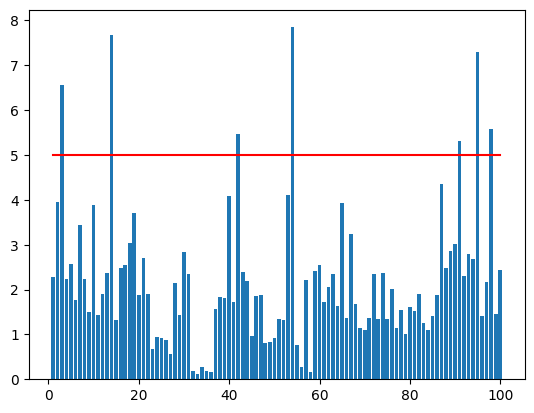

In [ ]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [5, 5], color = 'red')

count    100.000000
mean       2.198992
std        1.539257
min        0.127715
25%        1.333220
50%        1.878930
75%        2.540719
max        7.846366
dtype: float64


<Axes: >

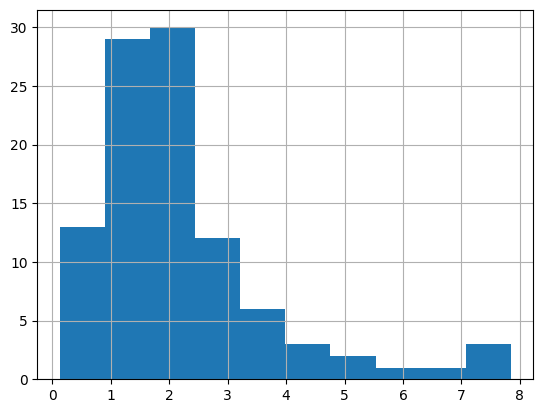

In [ ]:
print(pd.Series(smape_list).describe())
pd.Series(smape_list).hist()

In [ ]:
cat_params['best_it'] = best_it
cat_params

,iterations,learning_rate,depth,l2_leaf_reg,subsample,colsample_bylevel,random_strength,best_it
0,500,0.03,8,6,0.8,0.8,1,1141
1,500,0.03,8,2,0.8,0.8,1,518
2,500,0.01,4,2,0.8,0.8,1,311
3,500,0.01,4,6,0.8,0.8,5,344
4,500,0.03,6,6,0.8,0.8,1,396
...,...,...,...,...,...,...,...,...
95,500,0.07,4,4,0.8,0.8,7,266
96,500,0.05,6,8,0.8,0.8,1,288
97,500,0.07,6,8,0.8,0.8,3,154
98,500,0.07,4,8,0.8,0.8,1,1063


In [ ]:
cat_params.to_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/catboost/hyperparameter_cat0825.csv', index=False)

In [ ]:
## best hyperparameters 불러오기
cat_params = pd.read_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/catboost/hyperparameter_cat0825.csv')

## test 전처리 데이터 불러오기

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/processing/test_preprocessed_incsolar_month_senstemp_timev2.csv')

## 예측

In [ ]:
cat_params

,iterations,learning_rate,depth,l2_leaf_reg,subsample,colsample_bylevel,random_strength,best_it
0,500,0.03,8,6,0.8,0.8,1,1141
1,500,0.03,8,2,0.8,0.8,1,518
2,500,0.01,4,2,0.8,0.8,1,311
3,500,0.01,4,6,0.8,0.8,5,344
4,500,0.03,6,6,0.8,0.8,1,396
...,...,...,...,...,...,...,...,...
95,500,0.07,4,4,0.8,0.8,7,266
96,500,0.05,6,8,0.8,0.8,1,288
97,500,0.07,6,8,0.8,0.8,3,154
98,500,0.07,4,8,0.8,0.8,1,1063


In [ ]:
preds = np.array([])
for i in tqdm(range(100)):

    y_train = train.loc[train.num == i+1, 'power']
    x_train, x_test = train.loc[train.num == i+1, ].iloc[:, 3:], test.loc[test.num == i+1, ].iloc[:,2:]
    x_test = x_test[x_train.columns]

    cat = CatBoostRegressor(iterations = cat_params.iloc[i, -1], learning_rate = cat_params.iloc[i, 1], depth = cat_params.iloc[i, 2],
                           l2_leaf_reg = cat_params.iloc[i, 3], subsample = cat_params.iloc[i, 4], colsample_bylevel = cat_params.iloc[i, 5],
                           random_strength =  cat_params.iloc[i, 6], eval_metric = "SMAPE", loss_function = 'MAE', random_state = 42)

    cat.fit(x_train, y_train, verbose = False)
    y_pred = cat.predict(x_test)
    preds = np.append(preds, y_pred)

100%|██████████| 100/100 [01:45<00:00,  1.05s/it]


In [ ]:
# 예측 결과 시각화

preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train.loc[train.num == i+1, 'power'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.num == i+1, 'power'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_cat.png')
plt.show()

In [ ]:
submission = pd.read_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('/content/drive/MyDrive/전력사용량 예측 공모전/data/catboost/submission_cat0825.csv', index = False)